# Introduction

We're trying to understand how the spikes (and genes) behave on our single cell datasets

# Index

* Spike Scatter plots
* <a href="#Hs_purkinje-spike-scatter">Hs_purkinje spike scatter</a>
* <a href="#Hs_asp_purkinje_UMB5294-spike-scatter">Hs_asp_purkinje_UMB5294 spike scatter</a>
* <a href="#Mm_purkinje-spike-scatter">Mm_purkinje spike scatter</a>
* <a href="#Mm_pyramidal-spike-scatter">Mm_pyramidal spike scatter</a>

* <a href="#Genes-Detected">Genes Detected</a>
* <a href="#Hs_purkinje_poolsplit-Covariance">Hs_purkine_poolsplit Covariance</a>
* <a href="#Hs_purkinje_poolsplit-shuffled-Covariance">Hs_purkine_poolsplit Shuffled Covariance</a>
* <a href="#Hs_purkinje_poolsplit-shuffled-Genes-Detected">Hs_purkine_poolsplit Shuffled Genes Detected</a>

In [1]:
import pandas
import numpy
import os
import sys
import collections

import bokeh
from bokeh import mpl
from bokeh.plotting import figure, show, ColumnDataSource, output_file
from bokeh.io import output_notebook
import bokeh.io
import bokeh.resources
import bokeh.charts
from bokeh.models import HoverTool
from bokeh.palettes import *


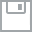
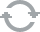
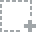
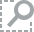
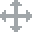
...
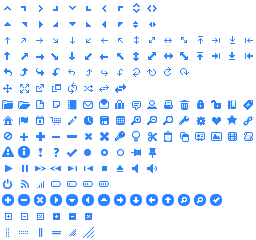
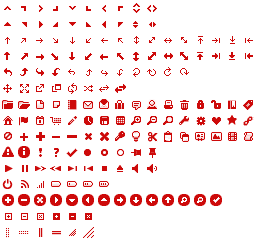
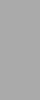
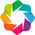
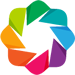

In [2]:
output_notebook()

In [3]:
LONG_RNA_SEQ = os.path.expanduser('~diane/proj/long-rna-seq-condor')
if LONG_RNA_SEQ not in sys.path:
    sys.path.append(LONG_RNA_SEQ)
from models import get_single_spike_cpc
from madqc import compute_all_vs_all_scores

In [4]:
def create_figure(xname, yname, extra_title='', **kwargs):
    hover = HoverTool(
        tooltips = [
            (xname, '@'+xname),
            (yname, '@'+yname),
            ('gene_id', '@gene_id'),
            ('library_id', '@library_id'),
            ('name', '@experiment_name'),
            # description is too long for my tooltip box
            #('description', '@description'),
            #('organism', '@organism'),
            #('biosample', '@biosample'),
            #('source', '@biosample_lab'),
            #('starting', '@starting'),
            #('age', '@age'),
            ('lab', '@lab'),
            #('rfa', '@rfa'),
        ]
    )    

    p = figure(
        title = "{} vs {} {}".format(xname, yname, extra_title),
        tools=['box_zoom', 'wheel_zoom', 'pan', hover, 'save', 'reset'],
        **kwargs
    )
    p.xaxis.axis_label = xname
    p.yaxis.axis_label = yname
    
    return p

def setdefault_style(**kwargs):
    extra = kwargs.copy()
    extra.setdefault('fill_alpha', 0.4)
    extra.setdefault('size', 7)
    extra.setdefault('line_color', 'black')
    extra.setdefault('line_alpha', 0.4)
    return extra



In [5]:
rsems = pandas.HDFStore('rsem-genes.h5', 'r')

In [6]:
library_to_name = {}
experiment_names = {}
for i, row in rsems['metadata'].iterrows():
    library_to_name[str(row.library_id)] = row.experiment_name
    experiment_names.setdefault(row.experiment_name, []).append(row.library_id)

In [7]:
for k in sorted(experiment_names.keys()):
    print(k, ','.join(experiment_names[k]))

Hs_asp_purkinje_UMB5294_poolsplit 13843,13844,13845,13846,13847,13848,13849,13850,13851,13852,13853,13854,13855,13856,13857,13858,13859,13860
Hs_asp_purkinje_UMB5294_single 13824,13825,13826,13827,13828,13829,13830,13831,13832,13833,13834,13835,13836,13837,13838,13839,13840,13841,13842
Hs_purkinje_poolsplit 13645,13646,13647,13648,13649,13650,13651,13652,13653,13654,13655,13656,13657,13658,13659,13660,13661,13662,13663,13664
Hs_purkinje_single 13625,13626,13627,13628,13629,13630,13631,13632,13633,13634,13635,13636,13637,13638,13639,13640,13641,13642,13643,13644
Mm_layer_V_pyramidal_poolsplit 15304,15305,15306,15307,15308,15309,15310,15311,15356,15357,15358,15359,15360,15361,15362
Mm_layer_V_pyramidal_single 15272,15273,15275,15276,15277,15278,15279,15280,15281,15282,15283,15284,15285,15286,15287,15352,15353,15354
Mm_purkinje_poolsplit 15288,15289,15290,15291,15292,15293,15294,15295,15296,15297,15298,15299,15300,15301,15302,15303
Mm_purkinje_single 15256,15257,15258,15259,15260,15261,15

In [8]:
name_to_color = {
    'Hs_asp_purkinje_UMB5294_poolsplit': Purples3[0],
    'Hs_asp_purkinje_UMB5294_single': Purples3[1],
    
    'Hs_purkinje_single': Oranges3[0],
    'Hs_purkinje_poolsplit': Oranges3[1],
    
    'Mm_purkinje_single': Blues3[0],
    'Mm_purkinje_poolsplit': Blues3[1],
    
    'Mm_layer_V_pyramidal_single': Greens3[0],
    'Mm_layer_V_pyramidal_poolsplit': Greens3[1],
}

def make_linked_axes():
    hs_purkinje_x = bokeh.models.DataRange1d()
    hs_asp_purkinje_x = bokeh.models.DataRange1d()
    mm_purkinje_x = bokeh.models.DataRange1d()
    mm_pyramidal_x = bokeh.models.DataRange1d()

    hs_purkinje_y = bokeh.models.DataRange1d()
    hs_asp_purkinje_y = bokeh.models.DataRange1d()
    mm_purkinje_y = bokeh.models.DataRange1d()
    mm_pyramidal_y = bokeh.models.DataRange1d()

    name = {}
    name['y'] = {
        'Hs_asp_purkinje_UMB5294_poolsplit': hs_asp_purkinje_y,
        'Hs_asp_purkinje_UMB5294_single': hs_asp_purkinje_y,
    
        'Hs_purkinje_single': hs_purkinje_y,
        'Hs_purkinje_poolsplit': hs_purkinje_y,
    
        'Mm_purkinje_single': mm_purkinje_y,
        'Mm_purkinje_poolsplit': mm_purkinje_y,
    
        'Mm_layer_V_pyramidal_single': mm_pyramidal_y,
        'Mm_layer_V_pyramidal_poolsplit': mm_pyramidal_y,
    }

    name['x'] = {
        'Hs_asp_purkinje_UMB5294_poolsplit': hs_asp_purkinje_x,
        'Hs_asp_purkinje_UMB5294_single': hs_asp_purkinje_x,
    
        'Hs_purkinje_single': hs_purkinje_x,
        'Hs_purkinje_poolsplit': hs_purkinje_x,
    
        'Mm_purkinje_single': mm_purkinje_x,
        'Mm_purkinje_poolsplit': mm_purkinje_x,
    
        'Mm_layer_V_pyramidal_single': mm_pyramidal_x,
        'Mm_layer_V_pyramidal_poolsplit': mm_pyramidal_x,
    }
    return name

In [9]:
spike_cpcs = dict(get_single_spike_cpc())

def make_spike_colors(cpcs):
    colors = [
        Blues3[0],
        Greens3[0],
        Reds3[0],
        Purples3[0],
        Greys3[0],
        BrBG3[2],
        Greys4[3],
    ]
    spike_color_map = {}
    cpc_counter = collections.Counter()
    
    for name, cpc in cpcs.items():
        spike_color_map[name] = colors[cpc_counter[cpc]]
        cpc_counter[cpc] += 1
    
    return spike_color_map

spike_color_map = make_spike_colors(spike_cpcs)

In [10]:
def jitter_spike(name):
    cpc = spike_cpcs.get(name, None)
    if cpc:
        spread = min((0.1 * cpc), 100)
        cpc = cpc + (spread * (numpy.random.random() - 0.5))
        return cpc
    return numpy.nan

In [11]:
#pool_fpkm = create_figure('spike_cpc', 'FPKM', 'Pool Split')
#single_fpkm = create_figure('spike_cpc', 'FPKM', 'Single')

name_axes = make_linked_axes()
plots  = {name: create_figure('spike_cpc', 'FPKM', name, 
                              y_range=name_axes['y'][name],
                              x_range=name_axes['x'][name],
                             ) for name in name_to_color }
extra = setdefault_style(fill_alpha=0.6)
missing_spike_data = collections.Counter()

for key in [ x for x in rsems.keys() if x.startswith('/genes/')]:
    library_id = key[-5:]
    experiment_name = library_to_name[library_id]
    rsem = rsems[key]
    spike_filter = rsem['gene_id'].map(lambda x: x.startswith('gSpikein'))

    rsem['library_id'] = library_id
    rsem['experiment_name'] = experiment_name
    rsem['spike_cpc'] = rsem[spike_filter]['gene_id'].map(jitter_spike)
    rsem['spike_color'] = rsem[spike_filter]['gene_id'].map(lambda x: spike_color_map.get(x))
    
    for spike_name in rsem[spike_filter]['gene_id']:
        if spike_name not in spike_color_map:
            missing_spike_data[spike_name] += 1
        
    plots[experiment_name].circle(
        'spike_cpc', 'FPKM', 
        source=ColumnDataSource(rsem[spike_filter]),
        color=rsem[spike_filter]['spike_color'],            
        #legend=name,
        **extra)

missing_spike_data

Counter({'gSpikein_ERCC-00128': 142, 'gSpikein_ERCC-00023': 142, 'gSpikein_ERCC-00007': 142, 'gSpikein_ERCC-00018': 142})

In [12]:
def show_and_save_pairs(plots, left, right, title):
    p = bokeh.io.hplot(plots[left], plots[right])
    filename = os.path.join('/dev/shm/{}.html'.format(title.lower().replace(' ', '_')))
    resources = bokeh.resources.Resources(
        mode='server',
        root_url='/~diane/bokeh/0.10.0/'
    )
    bokeh.io.save(obj=p, filename=filename, resources=resources, title=title)
    show(p)

# Hs_purkinje spike scatter

<a href="#Index">Back to index</a>

In [13]:
show_and_save_pairs(plots, 'Hs_purkinje_poolsplit', 'Hs_purkinje_single', 'HS_purkinje cpt vs FPKM')

# Hs_asp_purkinje_UMB5294 spike scatter

<a href="#Index">Back to index</a>

In [14]:
show_and_save_pairs(plots, 'Hs_asp_purkinje_UMB5294_poolsplit', 'Hs_asp_purkinje_UMB5294_single', 'HS_asp_purkinje_UMB5294 cpt vs FPKM')

#Mm_purkinje spike scatter

<a href="#Index">Back to index</a>

In [15]:
show_and_save_pairs(plots, 'Mm_purkinje_poolsplit', 'Mm_purkinje_single', 'Mm_purkinje cpt vs FPKM')

#Mm_pyramidal spike scatter

<a href="#Index">Back to index</a>

In [16]:
show_and_save_pairs(plots, 'Mm_layer_V_pyramidal_poolsplit', 'Mm_layer_V_pyramidal_single', 'Mm_pyramidal cpt vs FPKM')

#Genes Detected

In [17]:
def genes_detected_histogram(experiment_name, threshold=0):
    filename = experiment_name + '_FPKM.h5'
    store = pandas.HDFStore(filename, 'r')
    q = store['/quantifications']
    genes_detected = q[q > 0].count(axis=1)
    genes_detected.name = 'Genes Detected'
    return bokeh.charts.Histogram(genes_detected, title=experiment_name)

In [18]:
show(genes_detected_histogram('Hs_purkinje_poolsplit'))

In [19]:
show(genes_detected_histogram('Hs_purkinje_single'))

In [20]:
show(genes_detected_histogram('Mm_layer_V_pyramidal_poolsplit'))
show(genes_detected_histogram('Mm_layer_V_pyramidal_single'))

In [21]:
show(genes_detected_histogram('Mm_purkinje_poolsplit'))
show(genes_detected_histogram('Mm_purkinje_single'))

#Hs_purkinje_poolsplit Covariance

<a href="#Index">Back to index</a>

In [22]:
store = pandas.HDFStore('Hs_purkinje_poolsplit_FPKM.h5', 'r')
q = store['/quantifications']
store.close()

Compute covariance of good data

In [23]:
q.cov()

,13645,13646,13647,13648,13649,13650,13651,13652,13653,13654,13655,13656,13657,13658,13659,13660,13661,13662,13663,13664
13645,54592.017917,60896.788047,55670.680715,51849.869330,55283.802642,55109.557565,55528.154426,51953.000504,59992.981652,56009.737842,59517.216922,54562.463596,58542.462882,51475.429507,61575.265364,57816.337431,62800.503012,60392.437258,52912.524373,55585.135283
13646,60896.788047,68605.095655,62410.068441,58059.432175,61796.794864,61624.024835,62183.287207,58163.510672,67227.441827,62763.596471,66755.069859,61097.795110,65544.474304,57511.931721,68994.283674,64807.434883,70484.413908,67707.533498,59282.154699,62160.295368
13647,55670.680715,62410.068441,57419.229252,53234.760063,56445.219878,56404.302950,57077.403372,53156.111164,61525.560784,57458.148254,61036.211538,55905.218581,59955.830936,52713.075582,63099.696247,59212.449362,64532.680681,62027.009411,54507.113228,56760.743749
13648,51849.869330,58059.432175,53234.760063,50113.032733,52966.335491,52772.451292,53525.505954,49596.687906,57663.623365,54062.097551,57543.867748,52301.586885,56149.131868,49489.083525,59323.313774,55566.810261,60678.226502,58319.401967,50836.411234,52961.499913
13649,55283.802642,61796.794864,56445.219878,52966.335491,57373.453999,56342.343146,56779.707442,53130.834938,61415.339856,57695.860171,61477.378327,55700.285193,59880.220197,52983.553625,63134.420820,59347.904408,64513.087026,61903.195789,53542.093335,56973.780987
13650,55109.557565,61624.024835,56404.302950,52772.451292,56342.343146,56512.725654,56585.681166,52577.654066,61319.417643,57364.873152,60962.681142,55422.659852,59630.910057,52466.992254,63042.790181,59054.411512,64323.199434,61856.616848,53639.981752,56438.515435
13651,55528.154426,62183.287207,57077.403372,53525.505954,56779.707442,56585.681166,58425.620395,53119.607344,62274.925688,58461.151247,62482.105127,56138.215102,60599.971145,53131.432687,64251.195833,59954.453451,66157.772976,63175.461926,54775.776166,56664.326203
13652,51953.000504,58163.510672,53156.111164,49596.687906,53130.834938,52577.654066,53119.607344,50140.878856,57225.692293,53574.905835,56962.208279,52188.468687,55891.055512,49378.959890,58654.554642,55260.933899,59901.519594,57567.093483,50432.013542,53245.137195
13653,59992.981652,67227.441827,61525.560784,57663.623365,61415.339856,61319.417643,62274.925688,57225.692293,67876.494355,63241.521385,67506.158131,60665.733928,65388.617765,57275.682536,69573.506341,64935.381287,71342.316291,68304.406473,58729.541752,61394.291475
13654,56009.737842,62763.596471,57458.148254,54062.097551,57695.860171,57364.873152,58461.151247,53574.905835,63241.521385,59999.009472,63793.421452,56738.303854,61399.960790,53832.773460,65361.911262,60976.184343,67171.990724,64226.500189,54879.115925,57445.958058


#Hs_purkinje_poolsplit shuffled Covariance

<a href="#Index">Back to index</a>

Make bad data by shuffling values in two libraries

In [24]:
qbad = q.copy()

In [25]:
qbad['13648'] = numpy.random.permutation(qbad['13648'])
qbad['13652'] = numpy.random.permutation(qbad['13652'])

In [26]:
qbad.cov()

,13645,13646,13647,13648,13649,13650,13651,13652,13653,13654,13655,13656,13657,13658,13659,13660,13661,13662,13663,13664
13645,54592.017917,60896.788047,55670.680715,-22.804695,55283.802642,55109.557565,55528.154426,-81.066220,59992.981652,56009.737842,59517.216922,54562.463596,58542.462882,51475.429507,61575.265364,57816.337431,62800.503012,60392.437258,52912.524373,55585.135283
13646,60896.788047,68605.095655,62410.068441,-34.193785,61796.794864,61624.024835,62183.287207,-61.721555,67227.441827,62763.596471,66755.069859,61097.795110,65544.474304,57511.931721,68994.283674,64807.434883,70484.413908,67707.533498,59282.154699,62160.295368
13647,55670.680715,62410.068441,57419.229252,-31.881951,56445.219878,56404.302950,57077.403372,-67.246377,61525.560784,57458.148254,61036.211538,55905.218581,59955.830936,52713.075582,63099.696247,59212.449362,64532.680681,62027.009411,54507.113228,56760.743749
13648,-22.804695,-34.193785,-31.881951,50113.032733,-26.914446,-35.510008,-27.779469,34.839266,-32.374712,-36.933639,-36.345160,-29.557720,-25.167682,-35.695986,-11.995327,-26.168751,-35.440110,-31.016774,-20.866082,-32.023217
13649,55283.802642,61796.794864,56445.219878,-26.914446,57373.453999,56342.343146,56779.707442,-62.471785,61415.339856,57695.860171,61477.378327,55700.285193,59880.220197,52983.553625,63134.420820,59347.904408,64513.087026,61903.195789,53542.093335,56973.780987
13650,55109.557565,61624.024835,56404.302950,-35.510008,56342.343146,56512.725654,56585.681166,-69.995368,61319.417643,57364.873152,60962.681142,55422.659852,59630.910057,52466.992254,63042.790181,59054.411512,64323.199434,61856.616848,53639.981752,56438.515435
13651,55528.154426,62183.287207,57077.403372,-27.779469,56779.707442,56585.681166,58425.620395,-61.839191,62274.925688,58461.151247,62482.105127,56138.215102,60599.971145,53131.432687,64251.195833,59954.453451,66157.772976,63175.461926,54775.776166,56664.326203
13652,-81.066220,-61.721555,-67.246377,34.839266,-62.471785,-69.995368,-61.839191,50140.878856,-54.677799,-66.179622,-49.143726,-89.997498,-60.985827,-42.216053,-65.397624,-61.817230,-58.950087,-54.444631,-42.081687,-64.328767
13653,59992.981652,67227.441827,61525.560784,-32.374712,61415.339856,61319.417643,62274.925688,-54.677799,67876.494355,63241.521385,67506.158131,60665.733928,65388.617765,57275.682536,69573.506341,64935.381287,71342.316291,68304.406473,58729.541752,61394.291475
13654,56009.737842,62763.596471,57458.148254,-36.933639,57695.860171,57364.873152,58461.151247,-66.179622,63241.521385,59999.009472,63793.421452,56738.303854,61399.960790,53832.773460,65361.911262,60976.184343,67171.990724,64226.500189,54879.115925,57445.958058


#Hs_purkinje_poolsplit shuffled Genes Detected

<a href="#Index">Back to index</a>

With the shuffled data how does the Gene Detetected metric work?

In [27]:
genes_detected = qbad[qbad > 0].count(axis=1)
genes_detected.name = 'Genes Detected'
show(bokeh.charts.Histogram(genes_detected))

In [28]:
spikes_detected = genes_detected[genes_detected.index.map(lambda x: x.startswith('gSpikein'))]

In [29]:
spikes_detected[spikes_detected > 18]

gene_id
gSpikein_ERCC-00002    20
gSpikein_ERCC-00003    20
gSpikein_ERCC-00009    19
gSpikein_ERCC-00022    19
gSpikein_ERCC-00042    19
gSpikein_ERCC-00060    19
gSpikein_ERCC-00074    20
gSpikein_ERCC-00076    19
gSpikein_ERCC-00108    19
gSpikein_ERCC-00113    19
gSpikein_ERCC-00130    19
gSpikein_ERCC-00136    19
gSpikein_ERCC-00145    20
Name: Genes Detected, dtype: int64

In [30]:
spike_concentration = get_single_spike_cpc()

In [31]:
names = []
for name in spikes_detected[spikes_detected  >= 18].index:
    names.append((name, spikes_detected[name], spike_concentration[name]))
sorted_names = sorted(names, key=lambda x: x[2])
print(len(sorted_names))
for n in sorted_names:
    print('{} {} {:>8.2f}'.format(*n))

19
gSpikein_ERCC-00022 19    28.22
gSpikein_ERCC-00060 19    28.22
gSpikein_ERCC-00076 19    28.22
gSpikein_ERCC-00092 18    28.22
gSpikein_ERCC-00042 19    56.44
gSpikein_ERCC-00043 18    56.44
gSpikein_ERCC-00111 18    56.44
gSpikein_ERCC-00003 20   112.88
gSpikein_ERCC-00009 19   112.88
gSpikein_ERCC-00108 19   112.88
gSpikein_ERCC-00145 20   112.88
gSpikein_ERCC-00136 19   225.75
gSpikein_ERCC-00046 18   451.50
gSpikein_ERCC-00113 19   451.50
gSpikein_ERCC-00004 18   903.00
gSpikein_ERCC-00002 20  1806.00
gSpikein_ERCC-00074 20  1806.00
gSpikein_ERCC-00096 18  1806.00
gSpikein_ERCC-00130 19  3612.00


In [32]:
len(spike_concentration[spike_concentration > 10])

26

In [33]:
q[q.index == 'gSpikein_ERCC-00116']

,13645,13646,13647,13648,13649,13650,13651,13652,13653,13654,13655,13656,13657,13658,13659,13660,13661,13662,13663,13664
gene_id,,,,,,,,,,,,,,,,,,,,
gSpikein_ERCC-00116,5.08,4.69,0.12,7.13,15.59,0.32,0,13.14,6.17,0,8.02,5.3,0,10.89,15.77,0,12.16,15.23,5.2,0


In [34]:
q[q.index.map(lambda x: x in (spike_concentration > 1000).index)]

,13645,13646,13647,13648,13649,13650,13651,13652,13653,13654,13655,13656,13657,13658,13659,13660,13661,13662,13663,13664
gene_id,,,,,,,,,,,,,,,,,,,,
gSpikein_ERCC-00002,895.12,853.62,917.74,1251.12,1566.51,1347.99,1906.75,1062.25,1897.22,1899.75,2426.33,1076.80,1531.66,1771.68,1910.55,1627.40,2753.27,2097.75,1202.83,1046.50
gSpikein_ERCC-00003,28.15,70.10,60.51,98.80,90.54,165.73,181.10,71.58,118.10,123.05,175.37,94.35,111.86,126.40,153.44,80.76,249.63,112.32,87.18,89.09
gSpikein_ERCC-00004,421.71,381.82,356.88,574.31,803.20,537.84,892.14,462.32,889.64,898.49,1064.84,539.61,847.06,788.43,925.52,760.07,1381.76,1079.06,450.57,487.63
gSpikein_ERCC-00009,88.86,40.02,73.94,146.65,91.50,59.30,137.71,68.93,52.51,147.06,111.10,64.84,42.06,134.23,29.17,98.54,100.58,106.37,78.39,56.91
gSpikein_ERCC-00012,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.94,0.00
gSpikein_ERCC-00013,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
gSpikein_ERCC-00014,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
gSpikein_ERCC-00016,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
gSpikein_ERCC-00017,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [35]:
tpms = { k[-5:]: rsems[k][['gene_id', 'TPM']].set_index('gene_id') for k in list(rsems.keys()) if k.startswith('/genes') }

In [36]:
for k in tpms:
    tpms[k].columns = [k]

In [37]:
fulltable = pandas.concat(list(tpms.values()), axis=1)

In [38]:
tpmspikes = fulltable[fulltable.index.map(lambda x: x.startswith('gSpikein'))]

In [39]:
spikesfrac = tpmspikes.sum(axis=0) / fulltable.sum(axis=0)

In [40]:
spikesfrac[spikesfrac > .05]

13854    0.063183
13633    0.119541
13853    0.059240
13835    0.080269
13849    0.064380
13839    0.082819
13852    0.053719
13830    0.061038
13845    0.054122
13850    0.136319
dtype: float64

In [41]:
spikesfrac['15283']

0.03584150860196203

In [42]:
fpkms = { k[-5:]: rsems[k][['gene_id', 'FPKM']].set_index('gene_id') for k in list(rsems.keys()) if k.startswith('/genes') }

In [43]:
for k in fpkms:
    fpkms[k].columns = [k]
fullfpkms = pandas.concat(list(fpkms.values()), axis=1)

In [44]:
fpkmspikes = fullfpkms[fullfpkms.index.map(lambda x: x.startswith('gSpikein'))]

In [45]:
fpkmspikemean = fpkmspikes[fpkmspikes > 0].dropna(how='any').mean(axis=0)

In [46]:
fpkmspikemean[fpkmspikemean > 1000]

13840    1730.453333
13828    1413.066000
13837    1008.314000
13854    3568.868667
13831    1338.320000
13633    6112.889333
13853    3494.657333
13857    2191.922667
13636    1474.187333
13838    2104.490667
13824    1523.095333
13635    1332.896000
13835    3894.807333
13848    1664.484000
13842    1102.703333
13849    3679.216000
13846    1415.219333
13832    1317.382667
13839    4141.052000
13661    1237.350667
13662    1033.822000
13856    1839.377333
13841    1179.164000
13860    2104.002000
13852    3219.029333
13629    1435.518667
13655    1172.741333
13843    1423.693333
13834    1280.256000
13830    3273.722667
13855    2138.768000
13859    1413.497333
13833    2040.344667
13637    1048.988000
13845    3337.502000
13836    1228.704667
13858    2103.948667
15283    2202.813333
13626    1158.324667
13850    8812.128000
13851    1964.186667
13844    1212.559333
dtype: float64

In [47]:
all_rna = pandas.HDFStore('all-rna-spikes.h5')

In [48]:
all_rna.keys()

['/None',
 '/references/ENCSR133ALU',
 '/references/ENCSR156CIL',
 '/references/ENCSR402QNO',
 '/references/ENCSR449DXG',
 '/references/ENCSR470JZL',
 '/references/ENCSR884LPM']

In [49]:
path = os.path.expanduser('~/proj/htsworkflow')
if path not in sys.path:
    sys.path.append(path)
from htsworkflow.submission.encoded import ENCODED

In [50]:
server = ENCODED('www.encodeproject.org')
server.load_netrc()

In [51]:
encode_library_cache = {}

In [52]:
def get_library_lab(library_id, cache):
    if library_id not in cache:
        obj = server.get_json('/library/'+library_id)
        cache[library_id] = obj

    lab = cache[library_id]['lab']
    _, lab = os.path.split(lab[:-1])
    
    return lab

def get_library_biosample_description(library_id, cache):
    if library_id not in cache:
        obj = server.get_json('/library/'+library_id)
        cache[library_id] = obj

    biosample = cache[library_id]['biosample']
    
    return biosample['description']
    

In [53]:
print(get_library_lab('ENCLB700NFV', encode_library_cache))
print(get_library_biosample_description('ENCLB700NFV', encode_library_cache))

barbara-wold
Mm_C57Bl6_8mo_M_WT_layerV_area 8000 square microns


In [ ]:
def scatter_encoded_spikes(table, cache):
    """Scatter plot of encoded extracted spikes
    """
    plot  = create_figure('spike_cpc', 'FPKM')
    extra = setdefault_style(fill_alpha=0.6)

    for library_id in table:
        lab = get_library_lab(library_id, cache)
        bio_description = get_library_biosample_description(library_id, cache)
        library = pandas.DataFrame(table[library_id].copy())
        library.columns = ['FPKM']
    
        library['library_id'] = library_id
        #library['experiment_name'] = experiment_name
        library['lab'] = lab
        library['name'] = bio_description
        library['spike_cpc'] = library.index.map(jitter_spike)
        library['spike_color'] = library.index.map(lambda x: spike_color_map.get(x))
        
        plot.circle(
            'spike_cpc', 'FPKM', 
            source=ColumnDataSource(library),
            color=library['spike_color'],            
            #legend=name,
            **extra)
    return plot
    

Plot libraries using single cell concentration

In [54]:
show(scatter_encoded_spikes(all_rna['/references/ENCSR133ALU'], encode_library_cache))

Plot libraries using Gingeras Ambion Mix 1

In [55]:
show(scatter_encoded_spikes(all_rna['/references/ENCSR156CIL'], encode_library_cache))

Plot libraries using our 1000x spikes.

In [56]:
show(scatter_encoded_spikes(all_rna['/references/ENCSR884LPM'], encode_library_cache))

- Compute distribution of how spikes correlate
- plot distribution of spikes for gingeras and us on the scatter plot style.
- how do the spikes perform on our 10ng when compared to our single cell.
- color spikes where the GC > .45 (or so), is their variance higher?
  figure out high GC.
  
- Also is 171's mates expressed higher than 5 fpkm expression?

- qc

  - Make sure at least N spikes are detected in a per tube
  - make sure at least N genes are detected in a per tube.
